# 1. OpenCV DNN Face Detector

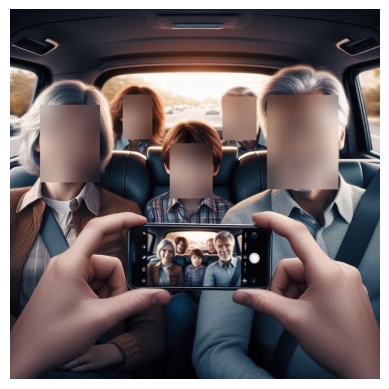

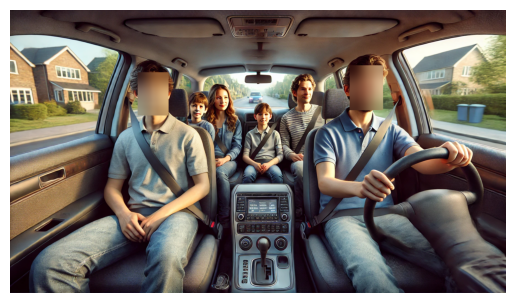

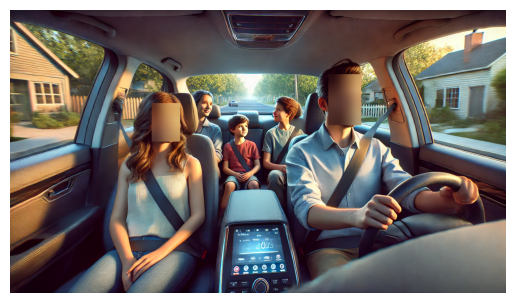

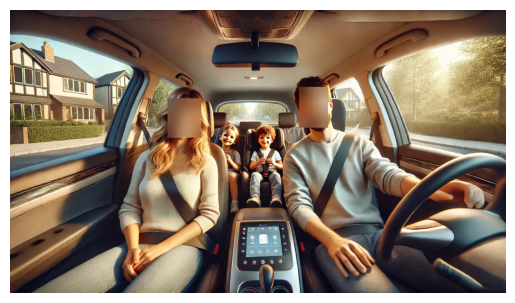

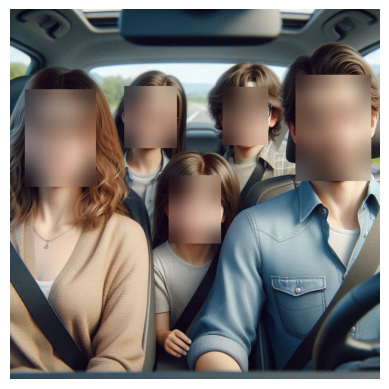

In [1]:
import cv2
import matplotlib.pyplot as plt

face_net = cv2.dnn.readNetFromTensorflow('opencv_face_detector_uint8.pb', 'opencv_face_detector.pbtxt')

def blur_faces_dnn_opencv_fd(image_path):
    img = cv2.imread(image_path)
    h, w = img.shape[:2]

    blob = cv2.dnn.blobFromImage(img, scalefactor=1.0, size=(300, 300),
                                 mean=(104.0, 177.0, 123.0), swapRB=False, crop=False)
    
    face_net.setInput(blob)
    detections = face_net.forward()

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]

        if confidence > 0.5:
            box = detections[0, 0, i, 3:7] * [w, h, w, h]
            x1, y1, x2, y2 = box.astype(int)

            face_roi = img[y1:y2, x1:x2]
            blurred_face = cv2.GaussianBlur(face_roi, (99, 99), 30)
            img[y1:y2, x1:x2] = blurred_face

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

blur_faces_dnn_opencv_fd('test.jpg')
blur_faces_dnn_opencv_fd('test_2.jpg')
blur_faces_dnn_opencv_fd('test_3.jpg')
blur_faces_dnn_opencv_fd('test_4.jpg')
blur_faces_dnn_opencv_fd('test_5.jpg')


# 2. Caffe Model (DNN Deploy Prototxt)

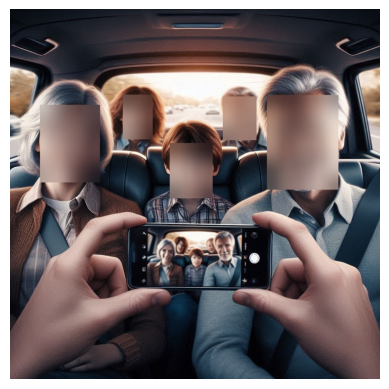

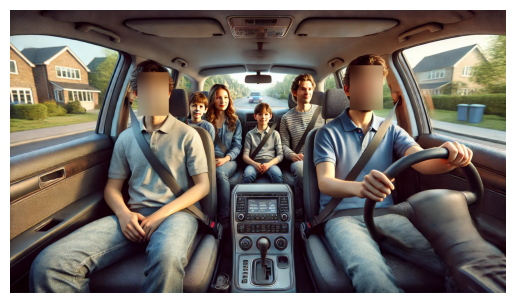

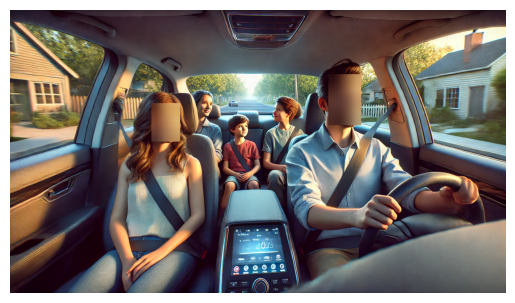

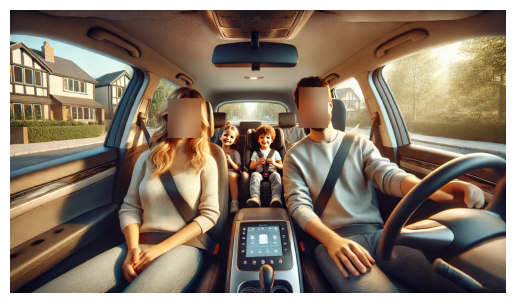

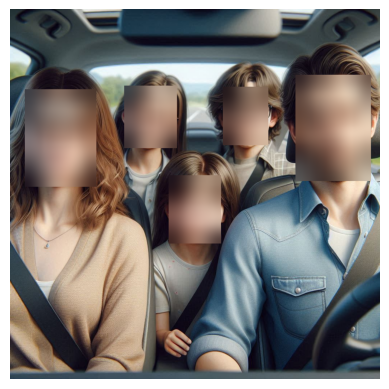

In [2]:
import cv2
import numpy as np

def blur_faces_dnn_deploy_prototxt(image_path):
    net = cv2.dnn.readNetFromCaffe('deploy.prototxt', 'res10_300x300_ssd_iter_140000.caffemodel')
    img = cv2.imread(image_path)
    h, w = img.shape[:2]
    blob = cv2.dnn.blobFromImage(img, 1.0, (300, 300), (104.0, 177.0, 123.0))

    net.setInput(blob)
    detections = net.forward()

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > 0.5:
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            x, y, x2, y2 = box.astype("int")
            roi = img[y:y2, x:x2]
            blurred = cv2.GaussianBlur(roi, (99, 99), 30)
            img[y:y2, x:x2] = blurred

    # Display the result
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.axis('off')
    plt.show()

blur_faces_dnn_deploy_prototxt("test.jpg")
blur_faces_dnn_deploy_prototxt("test_2.jpg")
blur_faces_dnn_deploy_prototxt("test_3.jpg")
blur_faces_dnn_deploy_prototxt("test_4.jpg")
blur_faces_dnn_deploy_prototxt("test_5.jpg")

# 3. MTCNN (Multi-task Cascaded CNN)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


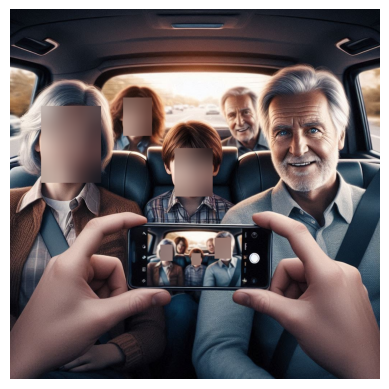

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step


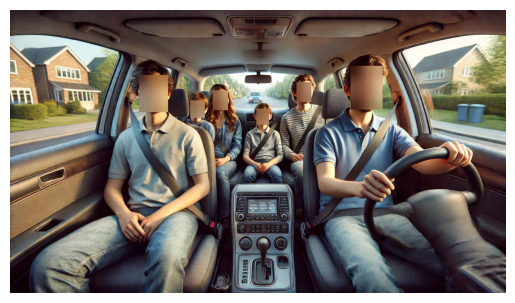

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


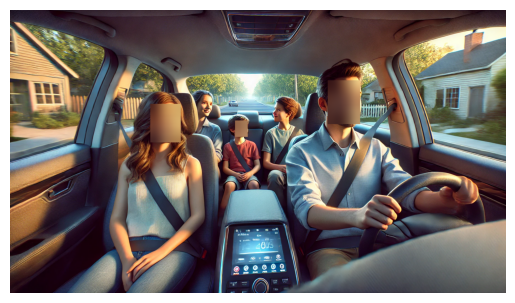

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


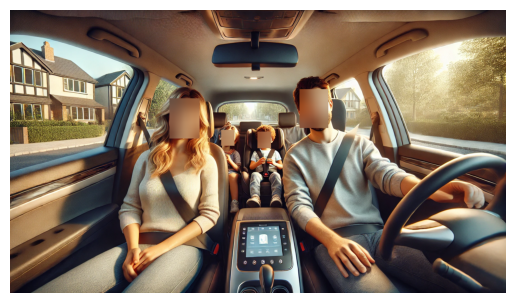

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


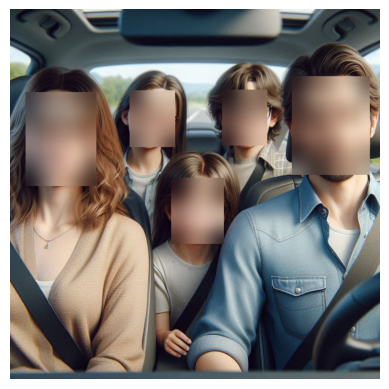

In [3]:
from mtcnn import MTCNN
import cv2
from matplotlib import pyplot as plt

def blur_faces_mtcnn(image_path):
    detector = MTCNN()
    img = cv2.imread(image_path)
    result = detector.detect_faces(img)

    for face in result:
        x, y, width, height = face['box']
        roi = img[y:y+height, x:x+width]
        blurred = cv2.GaussianBlur(roi, (99, 99), 30) 
        img[y:y+height, x:x+width] = blurred

    # Display the result
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.axis('off')
    plt.show()

blur_faces_mtcnn("test.jpg")
blur_faces_mtcnn("test_2.jpg")
blur_faces_mtcnn("test_3.jpg")
blur_faces_mtcnn("test_4.jpg")
blur_faces_mtcnn("test_5.jpg")



# 4. Dlib HOG Face Detector

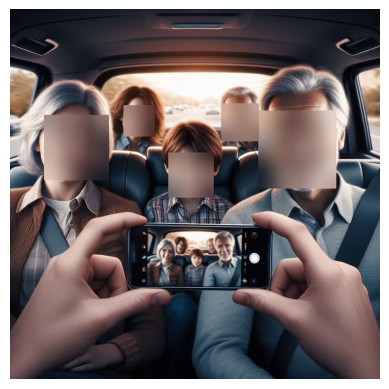

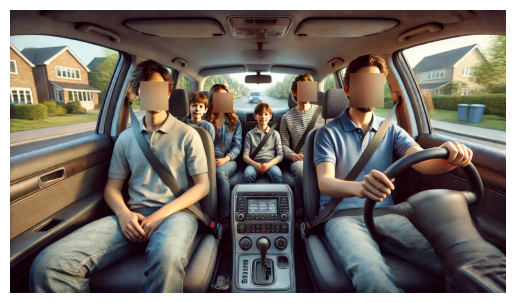

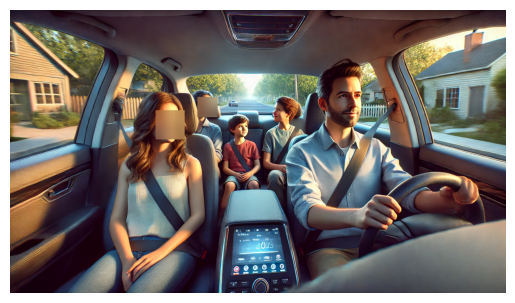

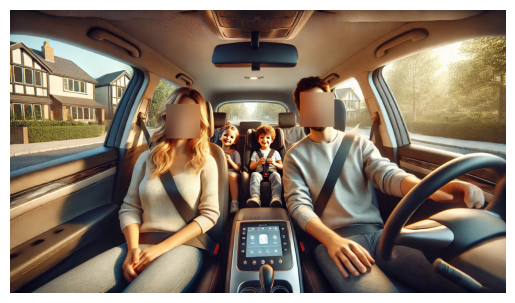

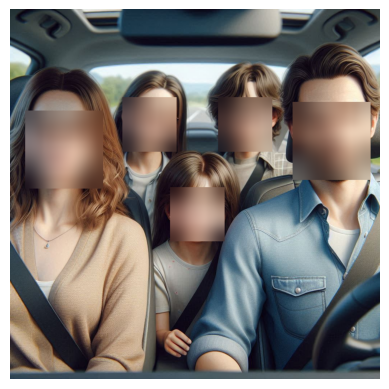

In [4]:
import dlib
import cv2


def blur_faces_dlib(image_path):
    detector = dlib.get_frontal_face_detector()
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = detector(gray)

    for face in faces:
        x, y, w, h = face.left(), face.top(), face.width(), face.height()
        roi = img[y:y+h, x:x+w]
        blurred = cv2.GaussianBlur(roi, (99, 99), 30)
        img[y:y+h, x:x+w] = blurred

    # Display the result
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.axis('off')
    plt.show()

blur_faces_dlib("test.jpg")
blur_faces_dlib("test_2.jpg")
blur_faces_dlib("test_3.jpg")
blur_faces_dlib("test_4.jpg")
blur_faces_dlib("test_5.jpg")


# 5. MediaPipe Face Detection

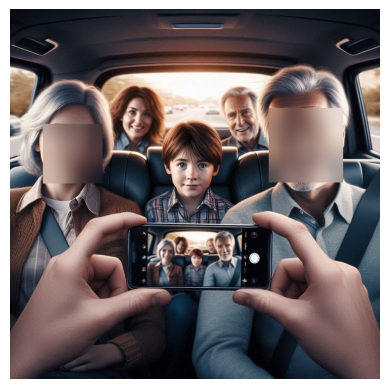

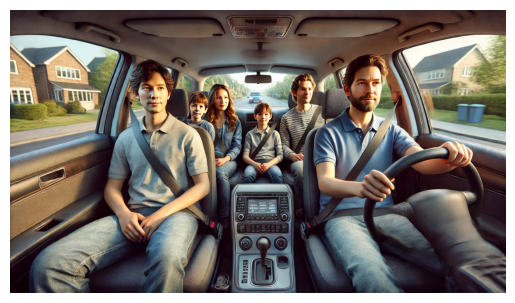

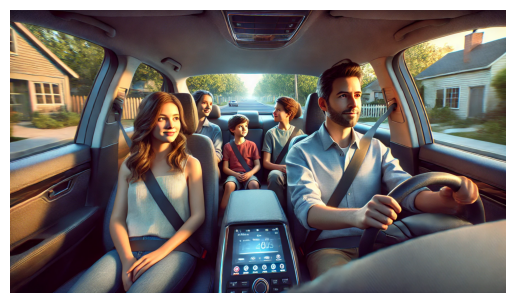

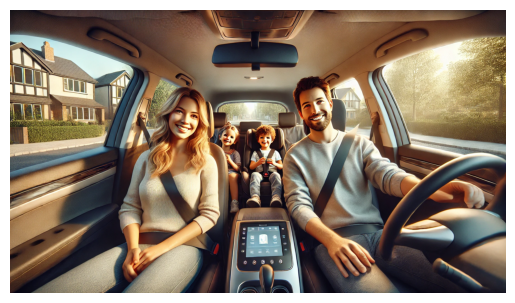

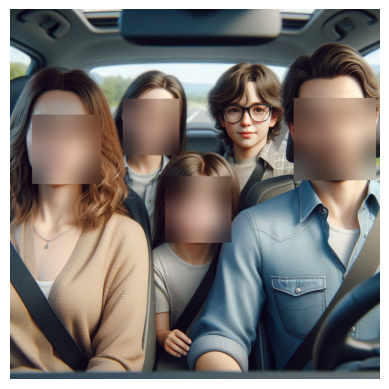

In [5]:
import cv2
import mediapipe as mp

def blur_faces_mediapipe(image_path):
    mp_face_detection = mp.solutions.face_detection
    face_detection = mp_face_detection.FaceDetection(min_detection_confidence=0.5)

    img = cv2.imread(image_path)
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = face_detection.process(rgb_img)

    if results.detections:
        for detection in results.detections:
            bboxC = detection.location_data.relative_bounding_box
            h, w, _ = img.shape
            x, y, w, h = int(bboxC.xmin * w), int(bboxC.ymin * h), int(bboxC.width * w), int(bboxC.height * h)
            roi = img[y:y+h, x:x+w]
            blurred = cv2.GaussianBlur(roi, (99, 99), 30)
            img[y:y+h, x:x+w] = blurred

    # Display the result
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
    plt.axis('off')
    plt.show()

blur_faces_mediapipe("test.jpg")
blur_faces_mediapipe("test_2.jpg")
blur_faces_mediapipe("test_3.jpg")
blur_faces_mediapipe("test_4.jpg")
blur_faces_mediapipe("test_5.jpg")

# 6. Haar Cascade Classifier

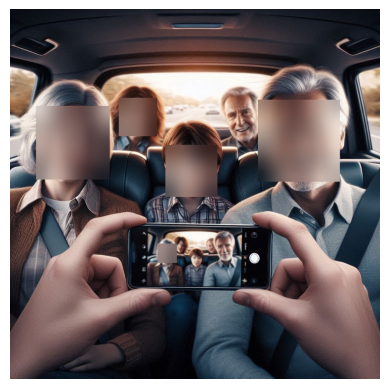

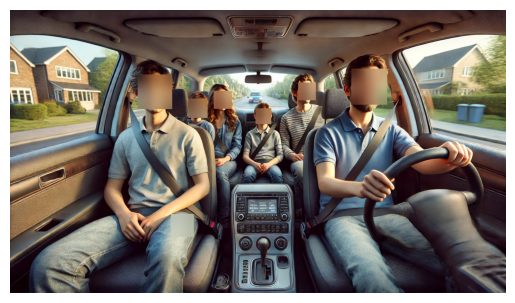

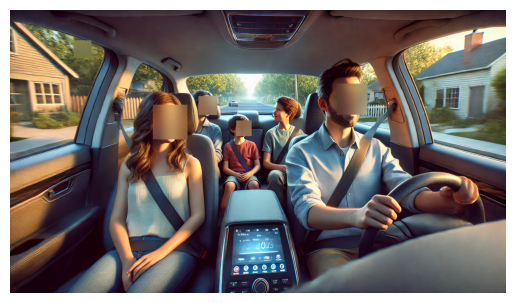

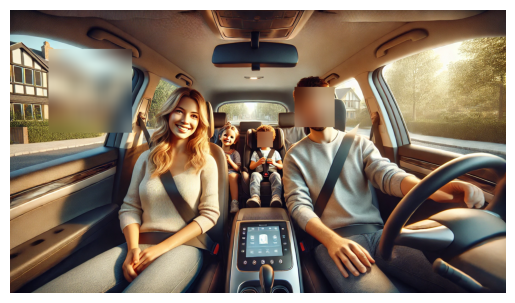

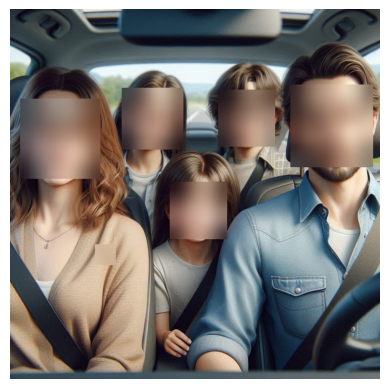

In [6]:
def blur_faces_haar(image_path):
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    for (x, y, w, h) in faces:
        roi = img[y:y+h, x:x+w]
        blurred = cv2.GaussianBlur(roi, (99, 99), 30)
        img[y:y+h, x:x+w] = blurred

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

blur_faces_haar("test.jpg")
blur_faces_haar("test_2.jpg")
blur_faces_haar("test_3.jpg")
blur_faces_haar("test_4.jpg")
blur_faces_haar("test_5.jpg")